# Nature-based climate resilience through shoreline transformation
Andre de Souza de Lima $^1$; Tyler Miesse $^1$; Daniel Cardona $^1$; Celso Ferreira $^1$; Ali Shahabi $^2$; Navid Tahvildari $^2$ 

$^1$ Department of Civil, Environmental and Infrastructure Engineering, George Mason University, Fairfax, VA 

$^2$ Department of Civil and Environmental Engineering, Old Dominion University, Norfolk, VA 
--- ---

<center><img src="https://github.com/dcardon2/Photos_for_VASG/blob/dcardon2-canal_photos/biogenic-solutions_53109206880_o.jpg?raw=true" width = "825" height = "480" align = "center"/></center>

## Introduction

Global climate change has led to many adverse impacts including changing weather patterns and an increase in the severity and frequency of extreme weather events. Traditional hard engineering solutions for coastal protection, such as seawalls and bulkheads, are becoming inadequate as they do not have the capacity to keep pace with the accelerating impacts of climate change. In response, there is growing interest in Natural and Nature-Based Features (NNBF), which offer innovative and adaptive approaches to coastal protection. NNBFs, such as salt marshes or living shorelines, have demonstrated potential for mitigating wave energy, reducing flood risks, and enhancing coastal resilience. However, the effectiveness of these features can vary based on their physical attributes and the specific environmental conditions in which they are implemented. The inconsistent performance of NNBFs has posed challenges for their widespread adoption, partly due to uncertainties in their efficacy and barriers in public policy.

This research focuses on evaluating the performance of NNBFs in attenuating waves through innovative field-scale prototypes and the natural environment. Here we aim to deepen our understanding of how these interventions can contribute to enhancing coastal resilience.

In [1]:
import warnings;warnings.filterwarnings("ignore")
import pathlib as pl;            import numpy as np
import netCDF4 as nc4;           import pandas as pd
import matplotlib.pyplot as plt; import xarray as xr
import json;                     import requests
import plotly.graph_objs as go;  import folium
from folium.plugins import BeautifyIcon; import matplotlib as mpl
import geopandas as gpd; from matplotlib.lines import Line2D
from random import randint
from chart_studio import plotly
from plotly.offline import plot,iplot, init_notebook_mode
from shapely import Polygon,Point,LineString
from datetime import date, datetime, timedelta
from plotly.subplots import make_subplots
import matplotlib
import matplotlib.lines as mlines
from matplotlib.dates import DateFormatter
from IPython.core.display import display, HTML
from sklearn.neighbors import BallTree
import io
from PIL import Image
import cartopy.crs as ccrs
import cartopy.feature as cfeature

In [2]:
root = pl.Path('C:/Users/dcardon2/OneDrive - George Mason University - O365 Production/fall_24/Independent_Study/Seagrant_Prj/Data/Marsh')

colors = {'1':'#D81B1B', '2':'#319FFF', '3':'#FFBF00', '4':'#1A8800'}

def datenum_to_datetime(datenum):
    """
    Convert Matlab datenum into Python datetime.
    :param datenum: Date in datenum format
    :return:        Datetime object corresponding to datenum.
    """
    if datenum < 1:
        temp = np.nan
    else:
        days = datenum % 1
        hours = days % 1 * 24
        minutes = hours % 1 * 60
        seconds = minutes % 1 * 60
        temp = datetime.fromordinal(int(datenum)) \
               + timedelta(days=int(days)) \
               + timedelta(hours=int(hours)) \
               + timedelta(minutes=int(minutes)) \
               + timedelta(seconds=round(seconds)) \
               - timedelta(days=366)
    return temp

def make_a_map(id, key, gdf, fg2, strings_dict):
    strings_dict['Transect'].append(gdf.Transects[id])
    strings_dict['Sensor Id'].append(gdf.Descriptio[id])
    strings_dict['Deployment'].append(gdf.Deployment[id])
    strings_dict['Location'].append(gdf.Location[id])
    strings_dict['Data Availability'].append(gdf.Data_avail[id])
    df = pd.DataFrame(strings_dict)
    html = df.to_html(
    classes = "table table-striped table-hover table-condensed table-responsive")
    popup = folium.Popup(html)
    folium.CircleMarker(
        (gdf.LocalLatit[id], gdf.LocalLongi[id]),
        color = colors[key],
        fill_color = colors[key],
        fill_opacity = 0.7,
        radius = 3,
        weight = 2,
        popup = popup
    ).add_to(fg2)
    
    return fg2

sensors_072123 = gpd.read_file( root / 'GPS' / '072123' / 'marsh0721_processed' / 'marsh_processed.shp' / 'sensors' )
sensors_072123['Transects'] = ['2', '2', '2', '3', '4', '3', '4', '4']
sensors_072123['Deployment'] = ['Deployment 1 - 07/21/23' for i in range(len(sensors_072123['Name']))]
sensors_072123['Descriptio'] = ['ODU1001', 'ODU1003', 'ODU1004', 'GMU01', 'ODU1008', 'GMU08', 'ODU1007', 'ODU1009']
sensors_072123['Location'] = ['Open Water', 'Oyster - Before', 'Oyster - After', 'Rock Sill Gap', 'Rock Sill - Before', 'Rock Sill Gap - After Marsh', 'Rock Sill - After Marsh', 'Rock Sill - After']
sensors_072123['Data_avail'] = ['7/21/23 - 8/28/23', '7/21/23 - 8/24/23', '7/21/23 - 8/24/23', '8/15/23 - 8/20/23', '7/21/23 - 8/13/23', '7/21/23 - 9/15/23', '7/21/23 - 8/13/23', '7/21/23 - 8/13/23']

sensors_092223 = gpd.read_file( root / 'GPS' / '092223' / 'marsh_0922_processed' / 'marsh_0922_processed_shapefile' / 'sensors' )
sensors_092223['Transects'] = ['3', '2', '3']
sensors_092223['Deployment'] = ['Deployment 2 - 09/22/23' for i in range(len(sensors_092223['Name']))]
sensors_092223['Descriptio'] = ['GMU07', 'GMU03', 'GMU10']
sensors_092223['Location'] = ['Rock Sill Gap', 'Oyster - After Marsh', 'Rock Sill Gap - After Marsh']
sensors_092223['Data_avail'] = ['9/22/23 - 11/13/23', '9/22/23 - 11/13/23', '9/22/23 - 11/13/23']

sensors_111023 = gpd.read_file( root / 'GPS' / '111023' / 'marsh_1110_processed_shapefile' / 'sensors' )
sensors_111023['Transects'] = ['3', '3', '2', '2', '2', '1', '1', '1', '1', '1']
sensors_111023['Deployment'] = ['Deployment 3 - 11/10/23' for i in range(len(sensors_111023['Name']))]
sensors_111023['Descriptio'] = ['GMU09', 'GMU12', 'GMU08', 'GMU06', 'GMU11', 'GMU14', 'GMU01', 'GMU02', 'GMU04', 'GMU05']
sensors_111023['Location'] = ['Rock Sill Gap - After Marsh', 'Rock Sill Gap', 'Oyster - Before', 'Oyster - After', 'Oyster - After Marsh', 'Open Water', 'Oyster - Before', 'Oyster - After', 'Marsh - Before', 'Marsh - After']
sensors_111023['Data_avail'] = ['11/10/23 - 1/2/24', '11/10/23 - 1/26/24', '11/10/23 - 12/23/23', '11/10/23 - 1/9/24', '11/10/23 - 1/11/24','None', '11/10/23 - 1/21/24', '11/10/23 - 1/10/24', '11/10/23 - 12/31/23', '11/10/23 - 1/9/24']

sensors_031524 = gpd.read_file( root / 'GPS' / '031524' / 'shapefile_sensors' )
sensors_031524['Transects'] = ['3', '3', '2', '2', '2', '1', '1', '1', '4', '4', '4']
sensors_031524['Deployment'] = ['Deployment 4 - 03/15/24' for i in range(len(sensors_031524['Name']))]
sensors_031524['Descriptio'] = ['GMU03', 'GMU07', 'GMU05', 'GMU09', 'GMU06', 'GMU10', 'GMU12', 'GMU04', 'ODU1008', 'ODU1007', 'ODU1009']  
sensors_031524['Location'] = ['Rock Sill Gap - After Marsh', 'Rock Sill Gap', 'Oyster - Before', 'Oyster - After', 'Oyster - After Marsh', 'Open Water', 'Oyster - Before', 'Oyster - After', 'Rock Sill - Before', 'Rock Sill - After Marsh', 'Rock Sill - After']
sensors_031524['Data_avail'] = ['3/15/24 - 5/23/24', '3/15/24 - 5/23/24', '3/15/24 - 5/23/24', '3/15/24 - 5/23/24', '3/15/24 - 5/23/24', '3/15/24 - 5/23/24', '3/15/24 - 5/23/24', '3/15/24 - 5/23/24', 'None', 'None', 'None']

sensors_092223.loc[3] = sensors_072123.loc[0].copy()
sensors_092223.loc[4] = sensors_072123.loc[1].copy()
sensors_092223.loc[5] = sensors_072123.loc[2].copy()
sensors_092223.loc[6] = sensors_072123.loc[6].copy()
sensors_092223['Deployment'] = ['Deployment 2 - 09/22/23' for i in range(len(sensors_092223['Name']))]
sensors_092223['Data_avail'] = ['9/22/23 - 11/13/23', '9/22/23 - 11/13/23', '9/22/23 - 11/13/23', '9/22/23 - 10/25/23', '9/22/23 - 11/9/23', '9/22/23 - 11/9/23', '9/22/23 - 11/6/23']

all_sensors = pd.merge(sensors_072123, sensors_111023, how = 'outer')
all_sensors = pd.merge(all_sensors, sensors_092223, how = 'outer')
all_sensors = pd.merge(all_sensors, sensors_031524, how = 'outer')


fnames_072123 = ['GMU01.nc','GMU08.nc']
odu_paths_072123 = ['1001.nc', '1003.nc', '1004.nc', '1007.nc', '1008.nc', '1009.nc']
fnames_092223 = ['GMU03.nc','GMU07.nc', 'GMU10.nc']
odu_paths_092223 = ['1001.nc', '1003.nc', '1004.nc', '1007.nc']
fnames_111023 = ['GMU01_new_water.nc', 'GMU02_after_new_oyster.nc', 'GMU04_new_marsh1.nc', 'GMU05_new_marsh.nc', 'GMU06_after_oyster.nc', 'GMU08_before_oyster.nc', 'GMU09_gap.nc', 'GMU11_marsh_oyster.nc', 'GMU12_gap_marsh2.nc']
fnames_031524 = ['GMU03.nc', 'GMU04.nc', 'GMU05.nc', 'GMU06.nc', 'GMU07.nc', 'GMU09.nc', 'GMU10.nc', 'GMU12.nc']  

def point_lookup(model_lat:np.array, model_lon:np.array, satellite_lat:np.array, satellite_lon:np.array):
    tree = BallTree(np.deg2rad(np.c_[model_lat,model_lon]), metric='haversine')
    distances, indices = tree.query(np.deg2rad(np.c_[satellite_lat, satellite_lon]), k = 1)
    return distances*6371,indices

def get_location(k, j):
    for i in k:
        if k == 'Deployment 1':
            for m in sensors_072123['Descriptio']:
                if (j.split('.')[0]) == m:
                    row = sensors_072123[sensors_072123['Descriptio'] == m]
                    L = list(row['Location'])[0]
                    return L
        
        elif k == 'Deployment 2':
            for m in sensors_092223['Descriptio']:
                if (j.split('.')[0]) == m:
                    row = sensors_092223[sensors_092223['Descriptio'] == m]
                    L = list(row['Location'])[0]
                    return L
        
        elif k == 'Deployment 3':
            for m in sensors_111023['Descriptio']:
                if (j.split('.')[0]) == m:
                    row = sensors_111023[sensors_111023['Descriptio'] == m]
                    L = list(row['Location'])[0]
                    return L
        
        elif k == 'Deployment 4':
            for m in sensors_031524['Descriptio']:
                if (j.split('.')[0]) == m:
                    row = sensors_031524[sensors_031524['Descriptio'] == m]
                    L = list(row['Location'])[0]
                    return L

def get_transect(k, j):
    for i in k:
        if k == 'Deployment 1':
            for s in sensors_072123['Descriptio']:
                if (j.split('.')[0]) == s:
                    row = sensors_072123[sensors_072123['Descriptio'] == s]
                    t = int(list(row['Transects'])[0])
                    return t
        
        elif k == 'Deployment 2':
            for s in sensors_092223['Descriptio']:
                if (j.split('.')[0]) == s:
                    row = sensors_092223[sensors_092223['Descriptio'] == s]
                    t = int(list(row['Transects'])[0])
                    return t
        
        elif k == 'Deployment 3':
            for s in sensors_111023['Descriptio']:
                if (j.split('.')[0]) == s:
                    row = sensors_111023[sensors_111023['Descriptio'] == s]
                    t = int(list(row['Transects'])[0])
                    return t
        
        elif k == 'Deployment 4':
            for s in sensors_031524['Descriptio']:
                if (j.split('.')[0]) == s:
                    row = sensors_031524[sensors_031524['Descriptio'] == s]
                    t = int(list(row['Transects'])[0])
                    return t

def updater(fig, xaxis = 'shared'):
    fig.update_layout(title_font_size = 32,
                      title_font_family = 'Times New Roman',
                      title_x = 0.5,
                      title_y = 0.2,
                      yaxis = dict(range = [0, 0.45]),
                      xaxis = dict(nticks = 10),
                      margin = dict(l = 20, r = 20, t = 50, b = 50))
    
    fig.update_xaxes(nticks = 10)
    fig.update_yaxes(title_text = 'Hs [m]')

    if xaxis == 'shared':
        fig.update_xaxes(title_text = 'Date', row = 4, col=1)
            
    return fig

def get_path(i):
    if i == fnames_072123:
        path = 'rbr_072123'
        return path
    elif i == odu_paths_072123:
        path = 'ODU_data/07XX23'
        return path
    elif i == fnames_092223:
        path = 'rbr_092223'
        return path
    elif i == odu_paths_092223:
        path = 'ODU_data/09XX23'
        return path
    elif i == fnames_111023:
        path = 'rbr_111023'
        return path
    elif i == fnames_031524:
        path = 'rbr_031524'
        return path

In [3]:
all_s = gpd.GeoDataFrame(all_sensors)

g = folium.Figure(width = 800, height = 400)
sensors_marsh = folium.Map(location = [37.323764181531935, -76.42804579034843], zoom_start = 18.45).add_to(g)
folium.TileLayer(
    tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
    attr = 'Esri',
    name = 'Esri Satellite',
    overlay = False,
    control = True
    ).add_to(sensors_marsh)

fg2 = folium.FeatureGroup('Canal Site').add_to(sensors_marsh)

strings_dict = {'Transect' : [], 
                'Sensor Id' : [], 
                'Deployment' : [],
                'Location' : [],
                'Data Availability' : []
                }

for key in colors.keys():
    ids = np.where(all_s['Transects'].str.contains(key, regex = False))[0]
    for id in ids:
        if id == 0:
            continue

        elif (all_s.LocalLatit[id] and all_s.LocalLongi[id]) != (all_s.LocalLatit[id - 1] and all_s.LocalLongi[id - 1]):
            strings_dict = {'Transect' : [], 
                            'Sensor Id' : [], 
                            'Deployment' : [],
                            'Location' : [],
                            'Data Availability' : []
                            }
        elif (all_s.Descriptio[id] == all_s.Descriptio[id - 1]) and (all_s.Deployment[id] == all_s.Deployment[id - 1]):
            continue
        make_a_map(id, key, all_s, fg2, strings_dict)
                
        
            
         
            
    
folium.LayerControl().add_to(sensors_marsh)

sensors_marsh

<em> Location of RBR solo D Wave Loggers</em>

### Results
Our results show that the installation of NNBFs in the canal had a substantial impact on wave height. The figure below shows times series of significant wave height (Hs) for each sensor. The sensors' data is then grouped by their affiliated NNBFs. Observe the decrease in wave magnitude before (solid lines) and after (dashed lines) the installation of the NNBFs. Notably, the sensors located along the banks show the most significant changes, as they are positioned behind the NNBFs. In contrast, the sensors located in the water, which are in front of the NNBFs, do not show the same level of difference.

In [4]:
fig = make_subplots(rows = 4, cols = 1, vertical_spacing = 0.1, subplot_titles = ['Transect 1', 'Transect 2', 'Transect 3', 'Transect 4'])

all_f_names = {'Deployment 1' : [fnames_072123, odu_paths_072123], 
               'Deployment 2' : [fnames_092223, odu_paths_092223], 
               'Deployment 3' : [fnames_111023], 
               'Deployment 4' : [fnames_031524]}

c = 1

colors_dict = {'Oyster - Before': '#710000',
               'Oyster - After': '#FF6464', 
               'Oyster - After Marsh': '#007BCC', 
               'Rock Sill Gap': '#FFB93D', 
               'Rock Sill - Before': 'Black', 
               'Rock Sill - After Marsh': '#60A9A7',
               'Rock Sill Gap - After Marsh': '#423D7D', 
               'Rock Sill - After': '#430080', 
               'Open Water': '#A5A5A5', 
               'Marsh - Before': '#FFC107', 
               'Marsh - After': '#004D40'}

legendgroup_names = ['Transect 1', 'Transect 2', 'Transect 3', 'Transect 4']
legendgroups = [1, 2, 3, 4]
tran_1 = []
tran_2 = []
tran_3 = []
tran_4 = []

loc_list = []
loc_dict = {'1': [],
            '2': [],
            '3': [],
            '4': []}

for k in all_f_names.keys():
    for i in range(len(all_f_names[k])):
        p = get_path(all_f_names[k][i])
        if i == 0:
            for j in range(len(all_f_names[k][i])):
                file = xr.open_dataset(root / 'Wave_data' / p / all_f_names[k][i][j])
                dt = []
                for t in range(len(file['Time'].data)):
                    dt.append(datenum_to_datetime(file['Time'].data[t]))
                hs = file['Hs']
                if k == 'Deployment 3':
                    t = get_transect(k, all_f_names[k][i][j].split('_')[0])
                    loc = get_location(k, all_f_names[k][i][j].split('_')[0])
                else:
                    t = get_transect(k, all_f_names[k][i][j])
                    loc = get_location(k, all_f_names[k][i][j])
                if t == 1:
                    if loc in loc_dict[str(t)]:
                        tran_1.append(go.Scatter(x = dt, y = hs, name = loc, line = dict(color = colors_dict[loc]),legendgrouptitle_text = legendgroup_names[0], legendgroup = legendgroups[0], showlegend = False))
                    else:
                        tran_1.append(go.Scatter(x = dt, y = hs, name = loc, line = dict(color = colors_dict[loc]),legendgrouptitle_text = legendgroup_names[0], legendgroup = legendgroups[0], showlegend = True))
                elif t == 2:
                    if loc in loc_dict[str(t)]:
                        tran_2.append(go.Scatter(x = dt, y = hs, name = loc, line = dict(color = colors_dict[loc]),legendgrouptitle_text = legendgroup_names[1], legendgroup = legendgroups[1], showlegend = False))
                    else:
                        tran_2.append(go.Scatter(x = dt, y = hs, name = loc, line = dict(color = colors_dict[loc]),legendgrouptitle_text = legendgroup_names[1], legendgroup = legendgroups[1], showlegend = True))
                elif t == 3:
                    if loc in loc_dict[str(t)]:
                        tran_3.append(go.Scatter(x = dt, y = hs, name = loc, line = dict(color = colors_dict[loc]),legendgrouptitle_text = legendgroup_names[2], legendgroup = legendgroups[2], showlegend = False))
                    else:
                        tran_3.append(go.Scatter(x = dt, y = hs, name = loc, line = dict(color = colors_dict[loc]),legendgrouptitle_text = legendgroup_names[2], legendgroup = legendgroups[2], showlegend = True))
                elif t == 4:
                    if loc in loc_dict[str(t)]:
                        tran_4.append(go.Scatter(x = dt, y = hs, name = loc, line = dict(color = colors_dict[loc]),legendgrouptitle_text = legendgroup_names[3], legendgroup = legendgroups[3], showlegend = False))
                    else:
                        tran_4.append(go.Scatter(x = dt, y = hs, name = loc, line = dict(color = colors_dict[loc]),legendgrouptitle_text = legendgroup_names[3], legendgroup = legendgroups[3], showlegend = True))
                loc_dict[str(t)].append(loc)
            
        else:
            for j in range(len(all_f_names[k][i])):
                file = xr.open_dataset(root / 'Wave_data'/ p / all_f_names[k][i][j])
                dt = pd.to_datetime(file['time'].data)
                hs = file['Hm0']
                odu_name = 'ODU'+ all_f_names[k][i][j]
                t = get_transect(k, odu_name)
                loc = get_location(k, odu_name)
                if t == 1:
                    if loc in loc_dict[str(t)]:
                        tran_1.append(go.Scatter(x = dt, y = hs, name = loc, line = dict(color = colors_dict[loc]),legendgrouptitle_text = legendgroup_names[0], legendgroup = legendgroups[0], showlegend = False))
                    else:
                        tran_1.append(go.Scatter(x = dt, y = hs, name = loc, line = dict(color = colors_dict[loc]),legendgrouptitle_text = legendgroup_names[0], legendgroup = legendgroups[0], showlegend = True))
                elif t == 2:
                    if loc in loc_dict[str(t)]:
                        tran_2.append(go.Scatter(x = dt, y = hs, name = loc, line = dict(color = colors_dict[loc]),legendgrouptitle_text = legendgroup_names[1], legendgroup = legendgroups[1], showlegend = False))
                    else:
                        tran_2.append(go.Scatter(x = dt, y = hs, name = loc, line = dict(color = colors_dict[loc]),legendgrouptitle_text = legendgroup_names[1], legendgroup = legendgroups[1], showlegend = True))
                elif t == 3:
                    if loc in loc_dict[str(t)]:
                        tran_3.append(go.Scatter(x = dt, y = hs, name = loc, line = dict(color = colors_dict[loc]),legendgrouptitle_text = legendgroup_names[2], legendgroup = legendgroups[2], showlegend = False))
                    else:
                        tran_3.append(go.Scatter(x = dt, y = hs, name = loc, line = dict(color = colors_dict[loc]),legendgrouptitle_text = legendgroup_names[2], legendgroup = legendgroups[2], showlegend = True))
                elif t == 4:
                    if loc in loc_dict[str(t)]:
                        tran_4.append(go.Scatter(x = dt, y = hs, name = loc, line = dict(color = colors_dict[loc]),legendgrouptitle_text = legendgroup_names[3], legendgroup = legendgroups[3], showlegend = False))
                    else:
                        tran_4.append(go.Scatter(x = dt, y = hs, name = loc, line = dict(color = colors_dict[loc]),legendgrouptitle_text = legendgroup_names[3], legendgroup = legendgroups[3], showlegend = True))
                loc_dict[str(t)].append(loc)

for i in tran_1:
    fig.add_trace(i, row = 1, col = 1)
for j in tran_2:
    fig.add_trace(j, row = 2, col = 1)
for k in tran_3:
    fig.add_trace(k, row = 3, col = 1)
for l in tran_4:
    fig.add_trace(l, row = 4, col = 1)  



fig = updater(fig)
fig.update_layout(height=600)
fig.show()




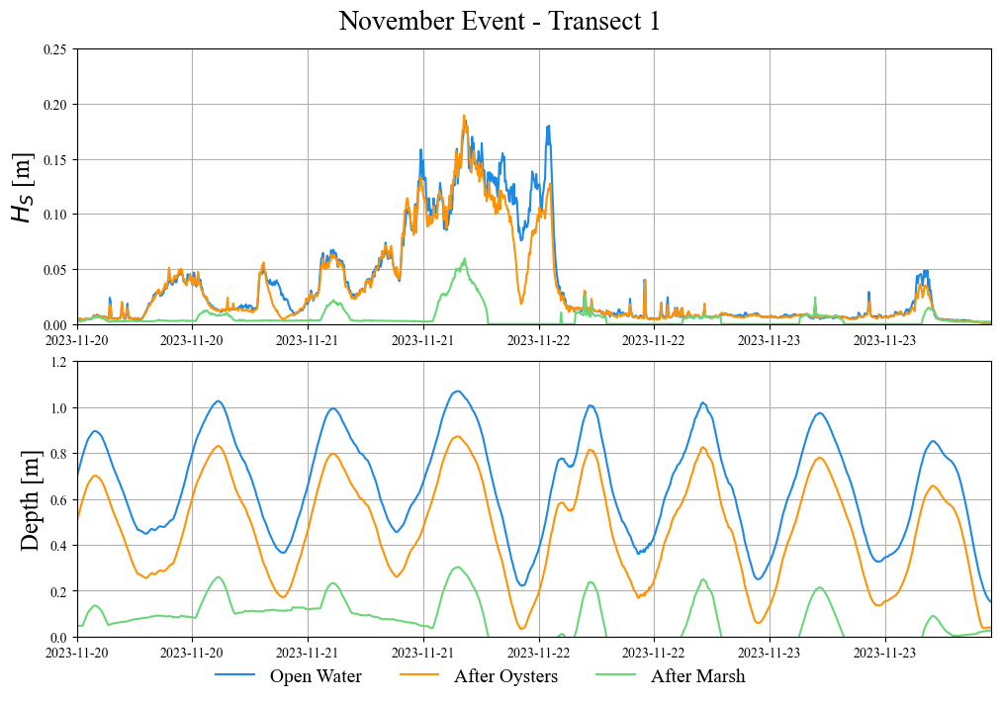

In [24]:
fnames_111023_new = ['GMU01.nc', 'GMU02.nc', 'GMU04.nc', 'GMU05.nc', 'GMU06.nc', 'GMU08.nc', 'GMU11.nc']
plt.rcParams["font.family"] = "Times New Roman"
fig, axs = plt.subplots(2, 1, layout = 'constrained', figsize=(10,7))
colors = ['#1E88E5','#FF9307', '#6AD679']


sensors_of_interest = ['GMU01', 'GMU02', 'GMU05']
names_dict = {'GMU01' : 'Open Water', 'GMU02' : 'After Oysters', 'GMU05' : 'After Marsh'}

for f in fnames_111023_new:
    file = xr.open_dataset(root / 'field' / 'marsh' / f)
    dt = []

    for s in range(len(sensors_of_interest)):
        if (f.split('.')[0] == sensors_of_interest[s]):
            for t in range(len(file['Time'].data)):
                dt.append(datenum_to_datetime(file['Time'].data[t]))
            
            hs = []
            wd = []
            time_new = []
            for h in range(len(file['Time'].data)):
                if datetime(2023, 11, 20, 0, 0) <= dt[h] <= datetime(2023, 11, 23, 23, 0):
                    hs.append(file['Hs'].data[h])
                    wd.append(file['depth'].data[h])
                    time_new.append(dt[h])
            axs[0].plot(time_new, hs, label = names_dict[f.split('.')[0]], color = colors[s])
            axs[1].plot(time_new, wd, label = names_dict[f.split('.')[0]],  color = colors[s])


fig.suptitle('November Event - Transect 1', fontsize=20)       
axs[0].set_ylabel(r'$H_{S}$ [m]',fontsize=18)
axs[0].set_ylim([-.00001,0.25000001])
dt1 = pd.to_datetime('2023-11-20')
dt2 = pd.to_datetime('2023-11-23 23:00')
axs[0].set_xlim([dt1,dt2])
axs[0].grid(True)

axs[0].xaxis.set_major_locator(plt.MaxNLocator(8))


axs[1].set_ylim([-.00001,1.2])
axs[1].set_ylabel(r'Depth [m]',fontsize=18)
axs[1].legend(loc='upper right', bbox_to_anchor=(0.75, -.05),ncol=3,frameon=False,fontsize=14)
axs[1].set_xlim([dt1,dt2])
axs[1].grid(True)
axs[1].xaxis.set_major_locator(plt.MaxNLocator(8))
plt.savefig(f'{root}/timeseries_new_transect.png',dpi=480,bbox_inches='tight',pad_inches=0.1,transparent=True)
plt.show()

In [6]:
stations = gpd.read_file(root / 'field' / 'marsh_11' / 'Points_111023_Sensors.shp')


stations

,Name,Descriptio,Layer,FeatureCod,Easting,Northing,Elevation,GlobalLati,GlobalLong,GlobalElli,LocalLatit,LocalLongi,LocalEllip,H_Prec_Obs,V_Prec_Obs,Date_Obs,Time_Obs,geometry
0,2001,GMU12,Points,None,3.683597e+06,1.112001e+06,0.077401,0.651434,-1.333925,-35.706727,37.324431,-76.428269,-35.706689,0.011488,0.019156,11/10/2023,11:56:38 AM,POINT Z (3683597.107 1112001.321 0.077)
1,2002,GMU9,Points,None,3.683598e+06,1.111994e+06,-1.835189,0.651433,-1.333925,-37.619449,37.324369,-76.428263,-37.619410,0.011892,0.019484,11/10/2023,11:59:04 AM,POINT Z (3683597.784 1111994.496 -1.835)
2,2003,GMU8,Points,None,3.683563e+06,1.111941e+06,-0.519140,0.651425,-1.333932,-36.303163,37.323896,-76.428669,-36.303125,0.013388,0.021329,11/10/2023,12:02:52 PM,POINT Z (3683562.903 1111941.251 -0.519)
3,2004,GMU6?,Points,None,3.683561e+06,1.111943e+06,-0.309012,0.651425,-1.333932,-36.092938,37.323910,-76.428695,-36.092900,0.013371,0.021211,11/10/2023,12:03:28 PM,POINT Z (3683560.598 1111942.754 -0.309)
4,2005,GMU11,Points,None,3.683554e+06,1.111943e+06,-0.464837,0.651425,-1.333934,-36.248560,37.323915,-76.428766,-36.248521,0.013284,0.020956,11/10/2023,12:04:12 PM,POINT Z (3683554.267 1111943.077 -0.465)
5,2006,ADCP,Points,None,3.683571e+06,1.111844e+06,-2.154853,0.651410,-1.333931,-37.940698,37.323019,-76.428603,-37.940660,0.014207,0.022903,11/10/2023,12:09:39 PM,POINT Z (3683570.913 1111844.041 -2.155)
6,2007,GMU 1,Points,None,3.683561e+06,1.111854e+06,-0.960532,0.651411,-1.333933,-36.745904,37.323107,-76.428716,-36.745866,0.014179,0.023408,11/10/2023,12:10:44 PM,POINT Z (3683560.712 1111853.572 -0.961)
7,2008,GMU2,Points,None,3.683558e+06,1.111855e+06,-0.765672,0.651411,-1.333933,-36.550940,37.323120,-76.428745,-36.550902,0.014060,0.023173,11/10/2023,12:11:09 PM,POINT Z (3683558.136 1111854.989 -0.766)
8,2009,GMU4,Points,None,3.683556e+06,1.111856e+06,0.053785,0.651412,-1.333934,-35.731404,37.323132,-76.428765,-35.731366,0.014485,0.023028,11/10/2023,12:11:38 PM,POINT Z (3683556.265 1111856.244 0.054)
9,2010,GMU5,Points,None,3.683545e+06,1.111868e+06,0.089081,0.651413,-1.333936,-35.695574,37.323236,-76.428889,-35.695536,0.014281,0.023409,11/10/2023,12:12:28 PM,POINT Z (3683545.026 1111867.522 0.089)


ValueError: Single argument to subplot must be a three-digit integer, not 3

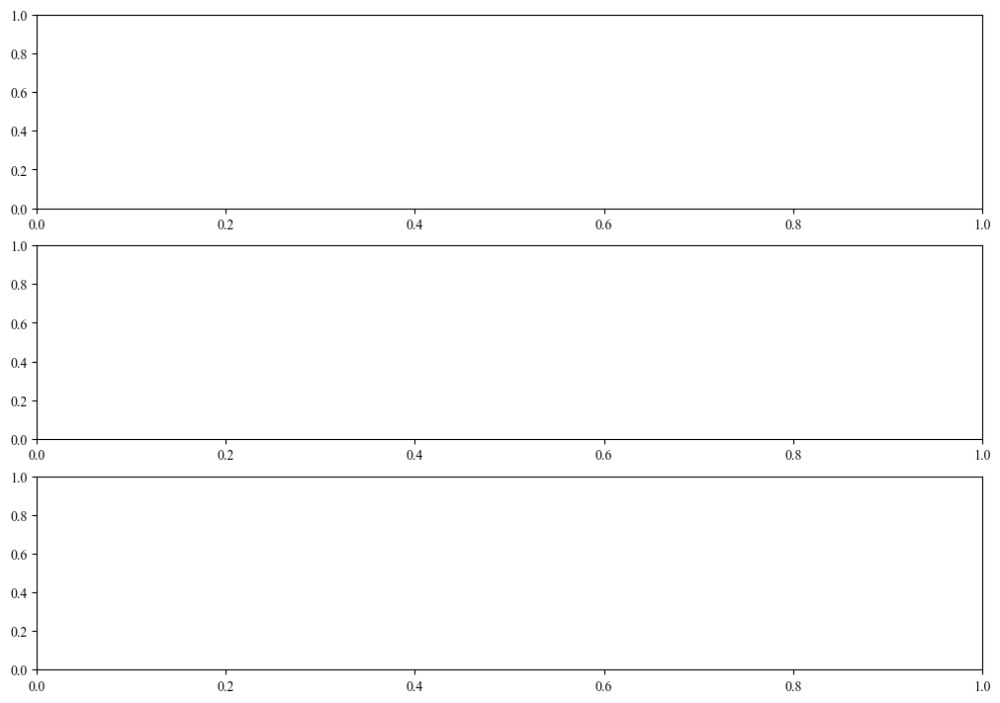

In [15]:
fnames_111023_new = ['GMU01.nc', 'GMU02.nc', 'GMU04.nc', 'GMU05.nc', 'GMU06.nc', 'GMU08.nc', 'GMU11.nc']
plt.rcParams["font.family"] = "Times New Roman"

fig, axs = plt.subplots(3, 1, layout = 'constrained', figsize=(10,7))
colors = ['#47A9FF','#FF425E','#FFC928']


sensors_of_interest = ['GMU01', 'GMU02', 'GMU05']
names_dict = {'GMU01' : 'Open Water', 'GMU02' : 'After Oysters', 'GMU05' : 'After Marsh'}

for f in fnames_111023_new:
    file = xr.open_dataset(root / 'field' / 'marsh' / f)
    dt = []

    for s in range(len(sensors_of_interest)):
        if (f.split('.')[0] == sensors_of_interest[s]):
            for t in range(len(file['Time'].data)):
                dt.append(datenum_to_datetime(file['Time'].data[t]))
            
            hs = []
            wd = []
            time_new = []
            for h in range(len(file['Time'].data)):
                if datetime(2023, 11, 20, 0, 0) <= dt[h] <= datetime(2023, 11, 23, 23, 0):
                    hs.append(file['Hs'].data[h])
                    wd.append(file['depth'].data[h])
                    time_new.append(dt[h])
            # Add a new subplot for the map
            axs_1 = fig.add_subplot(3, projection=ccrs.PlateCarree())
            axs_1.set_extent([-76.42, -76.43, -37.32, -37.33], crs=ccrs.PlateCarree())
            axs_1.add_feature(cfeature.LAND)
            axs_1.add_feature(cfeature.OCEAN)
            axs_1.add_feature(cfeature.COASTLINE)
            axs_1.add_feature(cfeature.BORDERS, linestyle=':')
            axs_1.add_feature(cfeature.LAKES, alpha=0.5)
            axs_1.add_feature(cfeature.RIVERS)

            # Plot sensor locations
            for sensor in range(len(sensors_of_interest)):
                sensor_data = stations[stations['Descriptio'] == sensors_of_interest[sensor]]
                axs_1.plot(sensor_data['LocalLongi'], sensor_data['LocalLatit'], 'o', transform=ccrs.PlateCarree(), label=names_dict[sensors_of_interest[sensor]])

            
            axs_1.set_title('Sensor Locations', fontsize=18)



    
axs[0].set_ylabel(r'$H_{S}$ [m]',fontsize=18)
axs[0].set_ylim([-.00001,0.25000001])
dt1 = pd.to_datetime('2023-11-20')
dt2 = pd.to_datetime('2023-11-23 23:00')
axs[0].set_xlim([dt1,dt2])
axs[0].grid(True)
axs[0].set_title('Significant Wave Height', fontsize=18)
axs[0].xaxis.set_major_locator(plt.MaxNLocator(8))

axs[1].set_title('Water Depth', fontsize=18)
axs[1].set_ylim([-.00001,1.2])
axs[1].set_ylabel(r'Depth [m]',fontsize=18)
axs[1].legend(loc='upper right', bbox_to_anchor=(0.75, -.05),ncol=3,frameon=False,fontsize=14)
axs[1].set_xlim([dt1,dt2])
axs[1].grid(True)
axs[1].xaxis.set_major_locator(plt.MaxNLocator(8))
plt.savefig(f'{root}/timeseries_new_transect.png',dpi=480,bbox_inches='tight',pad_inches=0.1,transparent=True)
plt.show()

In [ ]:
sensors_of_interest_new = ['GMU01', 'GMU02', 'GMU05']

dtw,dto,dtm = [],[],[]
wdw, wdo, wdm = [],[],[]
for f in fnames_111023_new:
    file = xr.open_dataset(root / 'field' / 'marsh' / f)
    dt = []
    wd = []
    
    for s in range(len(sensors_of_interest)):
        
        if (f.split('.')[0] == sensors_of_interest[s]):
            
            for t in range(len(file['Time'].data)):
                dt.append(datenum_to_datetime(file['Time'].data[t]))
                wd.append(file['depth'].data[t])
           
            for h in range(len(file['Time'].data)):
                   
                    if f.split('.')[0] == 'GMU01':
                        if (datetime(2023, 11, 21, 10, 0) <= dt[h] <= datetime(2023, 11, 22, 6, 0)) and wd[h] > 0.05:
                            dtw.append(file['Time'].data[h])
                            wdw.append(file['depth'].data[h])
                    
                    elif f.split('.')[0] == 'GMU02':
                        if wd[h] < 0.45:
                            wdo.append(file['depth'].data[h])
                    
                    elif f.split('.')[0] == 'GMU05':
                        if wd[h] > 0.1:
                            wdm.append(file['depth'].data[h])


print(id2marsh)

[]


In [12]:
olat,olon = stations['LocalLatit'][6],stations['LocalLongi'][6]
disto,ind = point_lookup(stations['LocalLatit'][7],stations['LocalLongi'][7],olat,olon)
distm,ind = point_lookup(stations['LocalLatit'][9],stations['LocalLongi'][9],olat,olon)
distm1,ind= point_lookup(stations['LocalLatit'][8],stations['LocalLongi'][8],olat,olon)
eleo = stations['Elevation'][7]
elem = stations['Elevation'][9]
elem1 = stations['Elevation'][8]

In [ ]:
for f in fnames_111023_new:
    file = xr.open_dataset(root / 'field' / 'marsh' / f)
    dt = []

    for s in range(len(sensors_of_interest_new)):
        if (f.split('.')[0] == sensors_of_interest_new[s]):
            for h in range(len(file['Time'].data)):
                if datetime(2023, 11, 21, 10, 0) <= dtw[h] <= datetime(2023, 11, 22, 6, 0):
                     

#id2oyster = np.intersect1d(idx,ido)

            

TypeError: '<' not supported between instances of 'Timestamp' and 'list'

In [ ]:
file = pd.read_excel(root / 'boat_runs_with_PWH.xlsx')


The figure below illustrates that peak wave heights were consistently higher before the implementation of NNBFs, highlighting the significant impact of these interventions on reducing wave energy. Each point on the graph represents a different run of the boat. Stars indicate heavy loading, while circles represent light loading. The colors signify the boat's speed during each run.

If a point appears above the diagonal center line in the figure, it indicates that the peak wave height for that run before the construction of the NNBF was greater than the corresponding peak wave height after the NNBF was built. During the both field experiments, boat weight and speed was changed to put NNBFs under varying conditions. Both boat speed and weight had impacts on wave height but boat speed seemed to have the largest impact. In fact, boat weight only accounted for 30% of the peak wave height. 

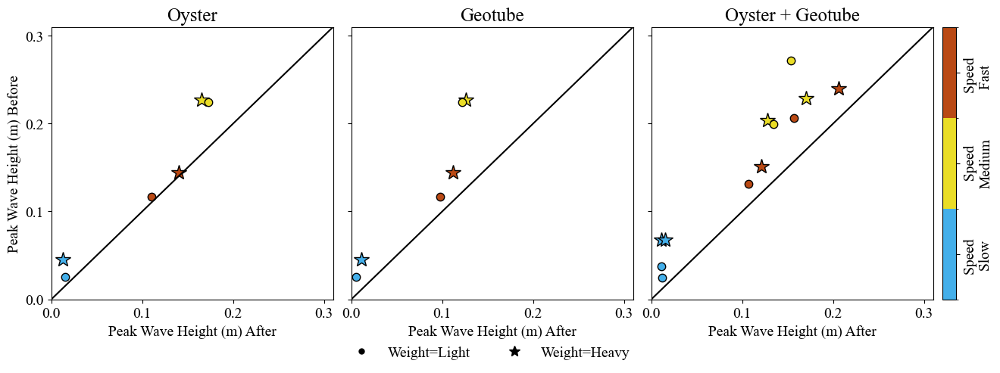

In [22]:
params = {'1':{'Heavy':'*','Light':'.','Slow':'#44AFEA','Medium':'#EADD27','Fast':'#B94914'},
          '2':{'Heavy':'*','Light':'.','Slow':'#44AFEA','Medium':'#EADD27','Fast':'#B94914'},
          '3':{'Heavy':'*','Light':'.','Slow':'#44AFEA','Medium':'#EADD27','Fast':'#B94914'},
          '4':{'Heavy':'*','Light':'.','Slow':'#44AFEA','Medium':'#EADD27','Fast':'#B94914'},
          '5':{'Heavy':'*','Light':'.','Slow':'#44AFEA','Medium':'#EADD27','Fast':'#B94914'}}
cmap = (mpl.colors.ListedColormap(['#44AFEA', '#EADD27', '#B94914']))
plt.rcParams["font.family"] = "Times New Roman"
fig = plt.figure(figsize=(12,4))
ax = [plt.axes([0.0,0.,0.31,0.9]),plt.axes([0.33,0.,0.31,0.9]),plt.axes([0.66,0.,0.31,0.9])]
bounds = [0,1, 2, 3]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
for f in file.index:
    if (file['Pairs'][f]==5):
        ax[1].plot(file['Peak Wave Height (m) After'][f],file['Peak Wave Height (m) Before'][f],params[str(file['Pairs'][f])][file['Weight'][f]],\
                color='k',markerfacecolor=params[str(file['Pairs'][f])][file['Speed'][f]],markersize=15,linewidth=0.05)
    elif (file['Pairs'][f]==2) or (file['Pairs'][f]==3):
        ax[2].plot(file['Peak Wave Height (m) After'][f],file['Peak Wave Height (m) Before'][f],params[str(file['Pairs'][f])][file['Weight'][f]],\
                color='k',markerfacecolor=params[str(file['Pairs'][f])][file['Speed'][f]],markersize=15,linewidth=0.05)
    elif (file['Pairs'][f]==4):
        ax[0].plot(file['Peak Wave Height (m) After'][f],file['Peak Wave Height (m) Before'][f],params[str(file['Pairs'][f])][file['Weight'][f]],\
                color='k',markerfacecolor=params[str(file['Pairs'][f])][file['Speed'][f]],markersize=15,linewidth=0.05)
for i in range(3):
    ax[i].plot([0,5],[0,5],'k')
    ax[i].set_xlim([0,0.31])
    ax[i].set_ylim([0,0.31])
    ax[i].set_xlabel('Peak Wave Height (m) After',fontsize=14)
    ax[i].set_xticks([0,0.1,0.2,0.3]),ax[i].set_yticks([0,0.1,0.2,0.3])
    ax[i].tick_params(axis='x', labelsize=14)
ax[0].tick_params(axis='y', labelsize=14)
cbar_ax = fig.add_axes([0.98,0.,0.015,0.9])
sm =  mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
cbar = fig.colorbar(sm,cax = cbar_ax,orientation='vertical')
cbar.ax.set_yticks([0.5,1.5,2.5])
cbar.ax.set_yticklabels(['Speed \n Slow','  Speed\nMedium','Speed \n Fast'],fontsize = 14,rotation=90,verticalalignment='center')
myHandle = [Line2D([], [], marker='.', color='k', markersize=10, linestyle='None'),
          Line2D([], [], marker='*', color='k', markersize=10, linestyle='None')] ##Create custom handles for 2nd legend
ax[0].set_ylabel('Peak Wave Height (m) Before',fontsize=14)
ax[1].set_yticklabels(['','','','']),ax[2].set_yticklabels(['','','',''])
ax[1].set_title('Geotube',fontsize=18),ax[2].set_title('Oyster + Geotube',fontsize=18),ax[0].set_title('Oyster',fontsize=18)
ax[0].legend(handles=myHandle,labels=['Weight=Light','Weight=Heavy'],loc='lower right', bbox_to_anchor=(2.1, -0.27),ncol=2,fontsize=14,frameon=False)


plt.show()

This figure illustrates the percent decrease in peak wave height observed in trials conducted before and after the construction of NNBFs. Similar to the previous figure, the colors indicate different boat speeds, while dotted lines represent trials with heavily loaded boats and solid lines indicate trials with lightly loaded boats. The data reveal a significant difference between the effects of a single NNBF and multiple NNBFs.
- At higher speeds, oyster reefs alone resulted in only a 5% decrease in peak wave height.
- A combination of NNBFs during the same trial achieved a remarkable 30% reduction. 
- These findings highlight that the combined use of NNBFs leads to greater wave attenuation. 
- At lower speeds, the combination of Geotubes™ and oyster reefs demonstrated exceptional effectiveness in the reduction of peak wave height, with percent reductions reaching as high as 80%. 

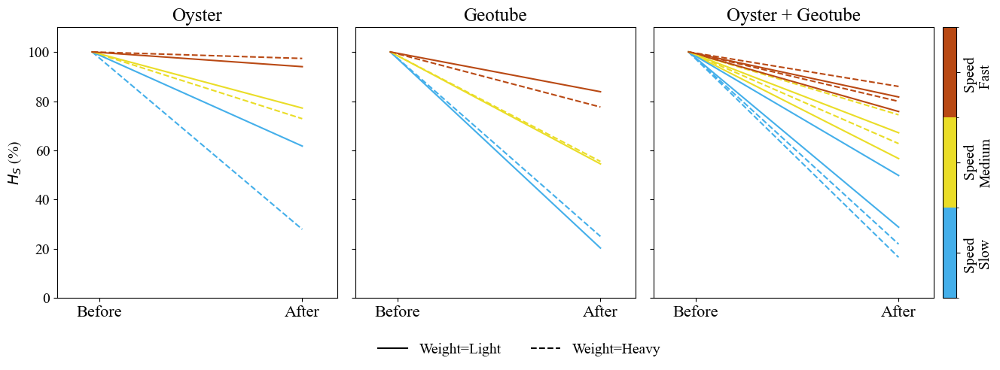

In [23]:
params = {'1':{'Heavy':'--','Light':'-','Slow':'#44AFEA','Medium':'#EADD27','Fast':'#B94914'},
          '2':{'Heavy':'--','Light':'-','Slow':'#44AFEA','Medium':'#EADD27','Fast':'#B94914'},
          '3':{'Heavy':'--','Light':'-','Slow':'#44AFEA','Medium':'#EADD27','Fast':'#B94914'},
          '4':{'Heavy':'--','Light':'-','Slow':'#44AFEA','Medium':'#EADD27','Fast':'#B94914'},
          '5':{'Heavy':'--','Light':'-','Slow':'#44AFEA','Medium':'#EADD27','Fast':'#B94914'}}
cmap = (mpl.colors.ListedColormap(['#44AFEA', '#EADD27', '#B94914']))
plt.rcParams["font.family"] = "Times New Roman"
fig = plt.figure(figsize=(12,4))
ax = [plt.axes([0.0,0.,0.31,0.9]),plt.axes([0.33,0.,0.31,0.9]),plt.axes([0.66,0.,0.31,0.9])]
bounds = [0,1, 2, 3]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
for f in file.index:
    if (file['Pairs'][f]==5):
        hs = [100*(file['Peak Wave Height (m) Before'][f]/file['Peak Wave Height (m) Before'][f]),
              100*(file['Peak Wave Height (m) After'][f]/file['Peak Wave Height (m) Before'][f])]
        ax[1].plot([0.25,0.55],hs,
                color=params[str(file['Pairs'][f])][file['Speed'][f]],
                linestyle=params[str(file['Pairs'][f])][file['Weight'][f]],markersize=15,linewidth=1.5)
        
    elif (file['Pairs'][f]==2) or (file['Pairs'][f]==3):
        hs = [100*(file['Peak Wave Height (m) Before'][f]/file['Peak Wave Height (m) Before'][f]),
              100*(file['Peak Wave Height (m) After'][f]/file['Peak Wave Height (m) Before'][f])]
        ax[2].plot([0.25,0.55],hs,
                color=params[str(file['Pairs'][f])][file['Speed'][f]],
                linestyle=params[str(file['Pairs'][f])][file['Weight'][f]],markersize=15,linewidth=1.5)
    elif (file['Pairs'][f]==4):
        hs = [100*(file['Peak Wave Height (m) Before'][f]/file['Peak Wave Height (m) Before'][f]),
              100*(file['Peak Wave Height (m) After'][f]/file['Peak Wave Height (m) Before'][f])]
        ax[0].plot([0.25,0.55],hs,
                color=params[str(file['Pairs'][f])][file['Speed'][f]],
                linestyle=params[str(file['Pairs'][f])][file['Weight'][f]],markersize=15,linewidth=1.5)

for i in range(3):
    ax[i].set_xticks([0.26,0.55])
    ax[i].set_xlim([.2,.6])
    ax[i].set_ylim([0,110])
    ax[i].set_xticklabels(['Before','After'],fontsize=16)
    
    for label in ax[i].get_xticklabels(which='major'):
        label.set(rotation=0, horizontalalignment='center')
ax[0].tick_params(axis='y', labelsize=14)
cbar_ax = fig.add_axes([0.98,0.,0.015,0.9])
sm =  mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
cbar = fig.colorbar(sm,cax = cbar_ax,orientation='vertical')
cbar.ax.set_yticks([0.5,1.5,2.5])
cbar.ax.set_yticklabels(['Speed \n Slow','  Speed\nMedium','Speed \n Fast'],fontsize = 14,rotation=90,verticalalignment='center')
myHandle = [Line2D([], [], linestyle='-', color='k', markersize=10),
          Line2D([], [], linestyle='--', color='k', markersize=10)] ##Create custom handles for 2nd legend
ax[0].set_ylabel(r'$H_{S}$ (%)',fontsize=14)
ax[1].set_yticklabels(['','','','','','']),ax[2].set_yticklabels(['','','','','',''])
ax[1].set_title('Geotube',fontsize=18),ax[2].set_title('Oyster + Geotube',fontsize=18),ax[0].set_title('Oyster',fontsize=18)
ax[0].legend(handles=myHandle,labels=['Weight=Light','Weight=Heavy'],loc='lower right', bbox_to_anchor=(2.2, -0.265),ncol=2,fontsize=14,frameon=False)

plt.show()